In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import pylab
from pylab import* 
import matplotlib.pyplot as plt
from pysqldf import SQLDF
sqldf= SQLDF(globals())
import psycopg2
from sklearn.preprocessing import StandardScaler
import pickle 
#import pdpbox
#from pdpbox import pdp
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

data to look at - https://data.london.gov.uk/dataset/londoners-reduced-mobility

# Loading Data

In [628]:
data = pd.read_csv('/Users/gregormilligan/Desktop/PhD Folder/Year 3/IEEE Big Dagta SWL Factors Paper/swl_with_loneliness_data.csv')

data.head(4)

,user_id,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,working_full_time,...,"income_range_Â£14,901- Â£24,300 p.a.","income_range_Â£24,301- Â£37,900 p.a.","income_range_Â£37,901- Â£58,900 p.a.",isolation_Hardly ever or never,isolation_Often,isolation_Some of the time,lack_companionship_Hardly ever or never,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group
0,85575,0,0,7,0,0,1,0,3,1,...,0,0,1,1,0,0,1,0,0,high
1,2618255,0,0,8,0,0,1,0,3,1,...,0,0,0,1,0,0,1,0,0,high
2,6226815,2,1,10,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,high
3,3829406,1,2,6,0,0,0,0,3,1,...,0,0,1,0,1,0,0,1,0,high


In [629]:
# adding in the age features
age_df = pd.read_csv("/Users/gregormilligan/Desktop/PhD Folder/Year 3/LOLO Project Folder/data/survey_response_including_network_stats.csv")
age_df = age_df[['user_id','age_range']]


In [630]:
data = age_df.merge(data, on='user_id')
data

,user_id,age_range,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,...,"income_range_Â£14,901- Â£24,300 p.a.","income_range_Â£24,301- Â£37,900 p.a.","income_range_Â£37,901- Â£58,900 p.a.",isolation_Hardly ever or never,isolation_Often,isolation_Some of the time,lack_companionship_Hardly ever or never,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group
0,85575,35 to 39,0,0,7,0,0,1,0,3,...,0,0,1,1,0,0,1,0,0,high
1,12054,35 to 39,2,2,3,0,0,0,1,2,...,0,0,0,0,1,0,0,0,1,low
2,1108729,55 to 59,0,0,8,0,0,0,1,4,...,0,0,0,1,0,0,1,0,0,high
3,1261411,60 to 64,2,1,7,0,0,0,0,1,...,0,0,1,0,0,1,0,0,1,high
4,1633334,30 to 34,2,1,7,0,0,0,0,4,...,0,1,0,0,0,1,0,0,1,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2817,2830306,60 to 64,0,0,8,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,high
2818,4231235,30 to 34,0,1,9,0,0,0,0,3,...,0,0,0,0,0,1,1,0,0,high
2819,1755786,40 to 44,2,0,9,0,0,0,0,3,...,0,0,0,1,0,0,0,0,1,high
2820,3990342,35 to 39,2,1,7,1,1,1,0,2,...,1,0,0,0,0,1,0,0,1,high


In [631]:
def remove_row_where_column_value_is_1(df, column_name, keep_rows_with_value_1=False):
  """
  Removes all rows from the DataFrame where the value in the specified column is 1.

  Args:
    df: A Pandas DataFrame.
    column_name: The name of the column to check.
    keep_rows_with_value_1: If True, the rows where the value in the specified column is 1 will be kept. Otherwise, the rows will be removed.

  Returns:
    A Pandas DataFrame with the rows where the value in the specified column is 1 removed (or kept, depending on the value of the `keep_rows_with_value_1` parameter).
  """

  # Get the rows where the value in the specified column is 1.
  rows_to_remove = df[df[column_name] == 1].index

  # If `keep_rows_with_value_1` is True, keep the rows where the value in the specified column is 1. Otherwise, remove them.
  if keep_rows_with_value_1:
    df = df.drop(rows_to_remove, complement=True)
  else:
    df = df.drop(rows_to_remove)

  return df
remove_row_where_column_value_is_1(data, 'gender_Prefer not to say')
remove_row_where_column_value_is_1(data, 'gender_Non binary/ other')

,user_id,age_range,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,...,"income_range_Â£14,901- Â£24,300 p.a.","income_range_Â£24,301- Â£37,900 p.a.","income_range_Â£37,901- Â£58,900 p.a.",isolation_Hardly ever or never,isolation_Often,isolation_Some of the time,lack_companionship_Hardly ever or never,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group
0,85575,35 to 39,0,0,7,0,0,1,0,3,...,0,0,1,1,0,0,1,0,0,high
1,12054,35 to 39,2,2,3,0,0,0,1,2,...,0,0,0,0,1,0,0,0,1,low
2,1108729,55 to 59,0,0,8,0,0,0,1,4,...,0,0,0,1,0,0,1,0,0,high
3,1261411,60 to 64,2,1,7,0,0,0,0,1,...,0,0,1,0,0,1,0,0,1,high
4,1633334,30 to 34,2,1,7,0,0,0,0,4,...,0,1,0,0,0,1,0,0,1,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2816,726859,55 to 59,0,0,4,0,0,0,0,4,...,1,0,0,1,0,0,1,0,0,low
2817,2830306,60 to 64,0,0,8,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,high
2818,4231235,30 to 34,0,1,9,0,0,0,0,3,...,0,0,0,0,0,1,1,0,0,high
2819,1755786,40 to 44,2,0,9,0,0,0,0,3,...,0,0,0,1,0,0,0,0,1,high


In [632]:
data['satisfaction_with_life'].value_counts()

8     794
7     645
9     315
6     312
5     286
10    171
4     128
3      89
2      46
1      36
Name: satisfaction_with_life, dtype: int64

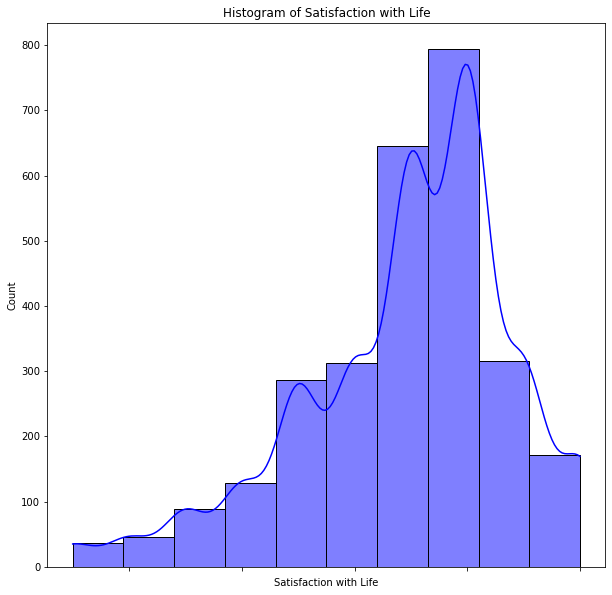

In [633]:
# Create the histogram
hist = sns.histplot(
    data=data,
    x='satisfaction_with_life',
    color='blue',
    bins=10,
    kde=True,
    
)

# Rotate the x labels to prevent overlapping
hist.set_xticklabels(hist.get_xticklabels(), rotation=45, ha='right')

# Add a title and axis labels
plt.title('Histogram of Satisfaction with Life')
plt.xlabel('Satisfaction with Life')

# Show the plot
plt.gcf().set_size_inches(10, 10)
plt.show()

In [634]:
def tertiles(df):
    df['satisfaction_with_life_tertile'] = pd.qcut(df['satisfaction_with_life'], 3, labels=['Low_swl', 'Medium_swl', 'High_swl'])
    return df

df = pd.DataFrame({'satisfaction_with_life': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]})
df = tertiles(df.copy())


print(df)

   satisfaction_with_life satisfaction_with_life_tertile
0                       1                        Low_swl
1                       2                        Low_swl
2                       3                        Low_swl
3                       4                        Low_swl
4                       5                     Medium_swl
5                       6                     Medium_swl
6                       7                     Medium_swl
7                       8                       High_swl
8                       9                       High_swl
9                      10                       High_swl


In [635]:
tertiles(data)

,user_id,age_range,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,...,"income_range_Â£24,301- Â£37,900 p.a.","income_range_Â£37,901- Â£58,900 p.a.",isolation_Hardly ever or never,isolation_Often,isolation_Some of the time,lack_companionship_Hardly ever or never,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group,satisfaction_with_life_tertile
0,85575,35 to 39,0,0,7,0,0,1,0,3,...,0,1,1,0,0,1,0,0,high,Low_swl
1,12054,35 to 39,2,2,3,0,0,0,1,2,...,0,0,0,1,0,0,0,1,low,Low_swl
2,1108729,55 to 59,0,0,8,0,0,0,1,4,...,0,0,1,0,0,1,0,0,high,Medium_swl
3,1261411,60 to 64,2,1,7,0,0,0,0,1,...,0,1,0,0,1,0,0,1,high,Low_swl
4,1633334,30 to 34,2,1,7,0,0,0,0,4,...,1,0,0,0,1,0,0,1,high,Low_swl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2817,2830306,60 to 64,0,0,8,0,0,0,0,0,...,0,0,1,0,0,1,0,0,high,Medium_swl
2818,4231235,30 to 34,0,1,9,0,0,0,0,3,...,0,0,0,0,1,1,0,0,high,High_swl
2819,1755786,40 to 44,2,0,9,0,0,0,0,3,...,0,0,1,0,0,0,0,1,high,High_swl
2820,3990342,35 to 39,2,1,7,1,1,1,0,2,...,0,0,0,0,1,0,0,1,high,Low_swl


In [636]:
data[['satisfaction_with_life_tertile']].value_counts()

satisfaction_with_life_tertile
Low_swl                           1542
Medium_swl                         794
High_swl                           486
dtype: int64

In [637]:
data[['satisfaction_with_life','satisfaction_with_life_tertile']].value_counts()

satisfaction_with_life  satisfaction_with_life_tertile
8                       Medium_swl                        794
7                       Low_swl                           645
9                       High_swl                          315
6                       Low_swl                           312
5                       Low_swl                           286
10                      High_swl                          171
4                       Low_swl                           128
3                       Low_swl                            89
2                       Low_swl                            46
1                       Low_swl                            36
dtype: int64

In [638]:
data['satisfaction_with_life_tertile'] = data['satisfaction_with_life_tertile'].cat.add_categories('Medium_High')

In [639]:
def combine_medium_and_high(df):
  """Combines the medium and high values in a DataFrame into a single medium and high value.

  Args:
    df: A Pandas DataFrame.

  Returns:
    A Pandas DataFrame with the medium and high values combined.
  """

  # Get the medium and high values.
  medium_values = df[df['satisfaction_with_life_tertile'] == 'Medium_swl']
  high_values = df[df['satisfaction_with_life_tertile'] == 'High_swl']

  # Combine the medium and high values into a single medium and high value.
  combined_medium_and_high_values = pd.concat([medium_values, high_values])
  combined_medium_and_high_values['satisfaction_with_life_tertile'] = 'Medium_High'

  # Replace the medium and high values with the combined medium and high value.
  df.loc[medium_values.index, 'satisfaction_with_life_tertile'] = 'Medium_High'
  df.loc[high_values.index, 'satisfaction_with_life_tertile'] = 'Medium_High'

  return df

combine_medium_and_high(data)

,user_id,age_range,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,...,"income_range_Â£24,301- Â£37,900 p.a.","income_range_Â£37,901- Â£58,900 p.a.",isolation_Hardly ever or never,isolation_Often,isolation_Some of the time,lack_companionship_Hardly ever or never,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group,satisfaction_with_life_tertile
0,85575,35 to 39,0,0,7,0,0,1,0,3,...,0,1,1,0,0,1,0,0,high,Low_swl
1,12054,35 to 39,2,2,3,0,0,0,1,2,...,0,0,0,1,0,0,0,1,low,Low_swl
2,1108729,55 to 59,0,0,8,0,0,0,1,4,...,0,0,1,0,0,1,0,0,high,Medium_High
3,1261411,60 to 64,2,1,7,0,0,0,0,1,...,0,1,0,0,1,0,0,1,high,Low_swl
4,1633334,30 to 34,2,1,7,0,0,0,0,4,...,1,0,0,0,1,0,0,1,high,Low_swl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2817,2830306,60 to 64,0,0,8,0,0,0,0,0,...,0,0,1,0,0,1,0,0,high,Medium_High
2818,4231235,30 to 34,0,1,9,0,0,0,0,3,...,0,0,0,0,1,1,0,0,high,Medium_High
2819,1755786,40 to 44,2,0,9,0,0,0,0,3,...,0,0,1,0,0,0,0,1,high,Medium_High
2820,3990342,35 to 39,2,1,7,1,1,1,0,2,...,0,0,0,0,1,0,0,1,high,Low_swl


In [640]:
data[['satisfaction_with_life','satisfaction_with_life_tertile']].value_counts()

satisfaction_with_life  satisfaction_with_life_tertile
8                       Medium_High                       794
7                       Low_swl                           645
9                       Medium_High                       315
6                       Low_swl                           312
5                       Low_swl                           286
10                      Medium_High                       171
4                       Low_swl                           128
3                       Low_swl                            89
2                       Low_swl                            46
1                       Low_swl                            36
dtype: int64

In [641]:
data['satisfaction_with_life_tertile'] = data['satisfaction_with_life_tertile'].cat.remove_categories(['Medium_swl', 'High_swl'])



In [642]:
data['satisfaction_with_life_tertile']  = data['satisfaction_with_life_tertile'] .apply(lambda x: 1 if x == 'Low_swl' else 0)

In [643]:
data[['satisfaction_with_life_tertile']].value_counts()

satisfaction_with_life_tertile
1                                 1542
0                                 1280
dtype: int64

In [644]:
data[['satisfaction_with_life_tertile']].value_counts()

satisfaction_with_life_tertile
1                                 1542
0                                 1280
dtype: int64

In [647]:
def one_hot_encode_df(df, features):
    """One-hot encodes the specified features in the dataframe.

  Args:
    df: The pandas dataframe.
    features: The list of features to one-hot encode.

  Returns:
    The one-hot encoded dataframe.
      """

    for feature in features:
        df = pd.get_dummies(df, columns=[feature])

    return df


#df = pd.DataFrame({'A': ['a', 'b', 'c'], 'B': [1, 2, 3]})
columns = ['age']

data = one_hot_encode_df(data.copy(), columns.copy())

data= data.fillna(0)
data
#label_encoded_df = label_encoded_df.drop('agree_with_the_following_statement', axis=1)
#label_encoded_df.to_csv('OHE_label_encoded_dataset.csv')

,user_id,age_range,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,...,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group,satisfaction_with_life_tertile,age_AGE_25_to_34,age_AGE_35_44,age_AGE_45_54,age_AGE_55_64,age_AGE_Over_65,age_AGE_Under_25
0,85575,35 to 39,0,0,7,0,0,1,0,3,...,0,0,high,1,0,1,0,0,0,0
1,12054,35 to 39,2,2,3,0,0,0,1,2,...,0,1,low,1,0,1,0,0,0,0
2,1108729,55 to 59,0,0,8,0,0,0,1,4,...,0,0,high,0,0,0,0,1,0,0
3,1261411,60 to 64,2,1,7,0,0,0,0,1,...,0,1,high,1,0,0,0,1,0,0
4,1633334,30 to 34,2,1,7,0,0,0,0,4,...,0,1,high,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2817,2830306,60 to 64,0,0,8,0,0,0,0,0,...,0,0,high,0,0,0,0,1,0,0
2818,4231235,30 to 34,0,1,9,0,0,0,0,3,...,0,0,high,0,1,0,0,0,0,0
2819,1755786,40 to 44,2,0,9,0,0,0,0,3,...,0,1,high,0,0,1,0,0,0,0
2820,3990342,35 to 39,2,1,7,1,1,1,0,2,...,0,1,high,1,0,1,0,0,0,0


data to look at - https://data.london.gov.uk/dataset/londoners-reduced-mobility

In [ ]:
# Age

In [405]:
data['age_range'].unique()

array(['35 to 39', '55 to 59', '60 to 64', '30 to 34', '40 to 44',
       '50 to 54', '25 to 29', '45 to 49', '20 to 24', '70 to 74',
       '65 to 69', '16 to 19', '75 to 79', '80 or over'], dtype=object)

In [646]:

def aggregate_age_values(df, age_column_name):
  """Aggregates age values in a DataFrame into the following values:
    AGE_Under_25
    AGE_25_to_34
    AGE_35_44
    AGE_45_54
    AGE_55_64
    AGE_Over_65

  Args:
    df: A Pandas DataFrame.
    age_column_name: The name of the column in the DataFrame that contains the age values.

  Returns:
    A Pandas Series with the aggregated age values.
  """

  # Create a dictionary to map the age values to the aggregated age values.
  age_map = {
    '16 to 19': 'AGE_Under_25',
    '20 to 24': 'AGE_Under_25',
    '25 to 29': 'AGE_25_to_34',
    '30 to 34': 'AGE_25_to_34',
    '35 to 39': 'AGE_35_44',
    '40 to 44': 'AGE_35_44',
    '45 to 49': 'AGE_45_54',
    '50 to 54': 'AGE_45_54',
    '55 to 59': 'AGE_55_64',
    '60 to 64': 'AGE_55_64',
    '65 to 69': 'AGE_Over_65',
    '70 to 74': 'AGE_Over_65',
    '75 to 79': 'AGE_Over_65',
    '80 or over': 'AGE_Over_65'
  }

  # Map the age values to the aggregated age values.
  df[age_column_name] = df[age_column_name].map(age_map)

  # Return the aggregated age values.
  return df[age_column_name]

# Example usage:

data['age'] = aggregate_age_values(data.copy(), 'age_range')
#data = data.drop('age_range', axis=1)
data.head()

,user_id,age_range,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,...,"income_range_Â£37,901- Â£58,900 p.a.",isolation_Hardly ever or never,isolation_Often,isolation_Some of the time,lack_companionship_Hardly ever or never,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group,satisfaction_with_life_tertile,age
0,85575,35 to 39,0,0,7,0,0,1,0,3,...,1,1,0,0,1,0,0,high,1,AGE_35_44
1,12054,35 to 39,2,2,3,0,0,0,1,2,...,0,0,1,0,0,0,1,low,1,AGE_35_44
2,1108729,55 to 59,0,0,8,0,0,0,1,4,...,0,1,0,0,1,0,0,high,0,AGE_55_64
3,1261411,60 to 64,2,1,7,0,0,0,0,1,...,1,0,0,1,0,0,1,high,1,AGE_55_64
4,1633334,30 to 34,2,1,7,0,0,0,0,4,...,0,0,0,1,0,0,1,high,1,AGE_25_to_34


In [648]:
data

,user_id,age_range,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,...,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group,satisfaction_with_life_tertile,age_AGE_25_to_34,age_AGE_35_44,age_AGE_45_54,age_AGE_55_64,age_AGE_Over_65,age_AGE_Under_25
0,85575,35 to 39,0,0,7,0,0,1,0,3,...,0,0,high,1,0,1,0,0,0,0
1,12054,35 to 39,2,2,3,0,0,0,1,2,...,0,1,low,1,0,1,0,0,0,0
2,1108729,55 to 59,0,0,8,0,0,0,1,4,...,0,0,high,0,0,0,0,1,0,0
3,1261411,60 to 64,2,1,7,0,0,0,0,1,...,0,1,high,1,0,0,0,1,0,0
4,1633334,30 to 34,2,1,7,0,0,0,0,4,...,0,1,high,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2817,2830306,60 to 64,0,0,8,0,0,0,0,0,...,0,0,high,0,0,0,0,1,0,0
2818,4231235,30 to 34,0,1,9,0,0,0,0,3,...,0,0,high,0,1,0,0,0,0,0
2819,1755786,40 to 44,2,0,9,0,0,0,0,3,...,0,1,high,0,0,1,0,0,0,0
2820,3990342,35 to 39,2,1,7,1,1,1,0,2,...,0,1,high,1,0,1,0,0,0,0


In [433]:
data['age'] = data['age'].astype('category')
data

,user_id,lack_companionship,isolation,satisfaction_with_life,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,working_full_time,...,isolation_Hardly ever or never,isolation_Often,isolation_Some of the time,lack_companionship_Hardly ever or never,lack_companionship_Often,lack_companionship_Some of the time,satisfaction_with_life_group,satisfaction_with_life_tertile,aggregated_age_values,age
0,85575,0,0,7,0,0,1,0,3,1,...,1,0,0,1,0,0,high,0,AGE_35_44,AGE_35_44
1,12054,2,2,3,0,0,0,1,2,0,...,0,1,0,0,0,1,low,0,AGE_35_44,AGE_35_44
2,1108729,0,0,8,0,0,0,1,4,0,...,1,0,0,1,0,0,high,1,AGE_55_64,AGE_55_64
3,1261411,2,1,7,0,0,0,0,1,0,...,0,0,1,0,0,1,high,0,AGE_55_64,AGE_55_64
4,1633334,2,1,7,0,0,0,0,4,1,...,0,0,1,0,0,1,high,0,AGE_25_to_34,AGE_25_to_34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2817,2830306,0,0,8,0,0,0,0,0,0,...,1,0,0,1,0,0,high,1,AGE_55_64,AGE_55_64
2818,4231235,0,1,9,0,0,0,0,3,1,...,0,0,1,1,0,0,high,1,AGE_25_to_34,AGE_25_to_34
2819,1755786,2,0,9,0,0,0,0,3,0,...,1,0,0,0,0,1,high,1,AGE_35_44,AGE_35_44
2820,3990342,2,1,7,1,1,1,0,2,0,...,0,0,1,0,0,1,high,0,AGE_35_44,AGE_35_44


# corr matrix 

Text(0.5, 1362.0937499999995, 'OLIO users characteristics correlations')

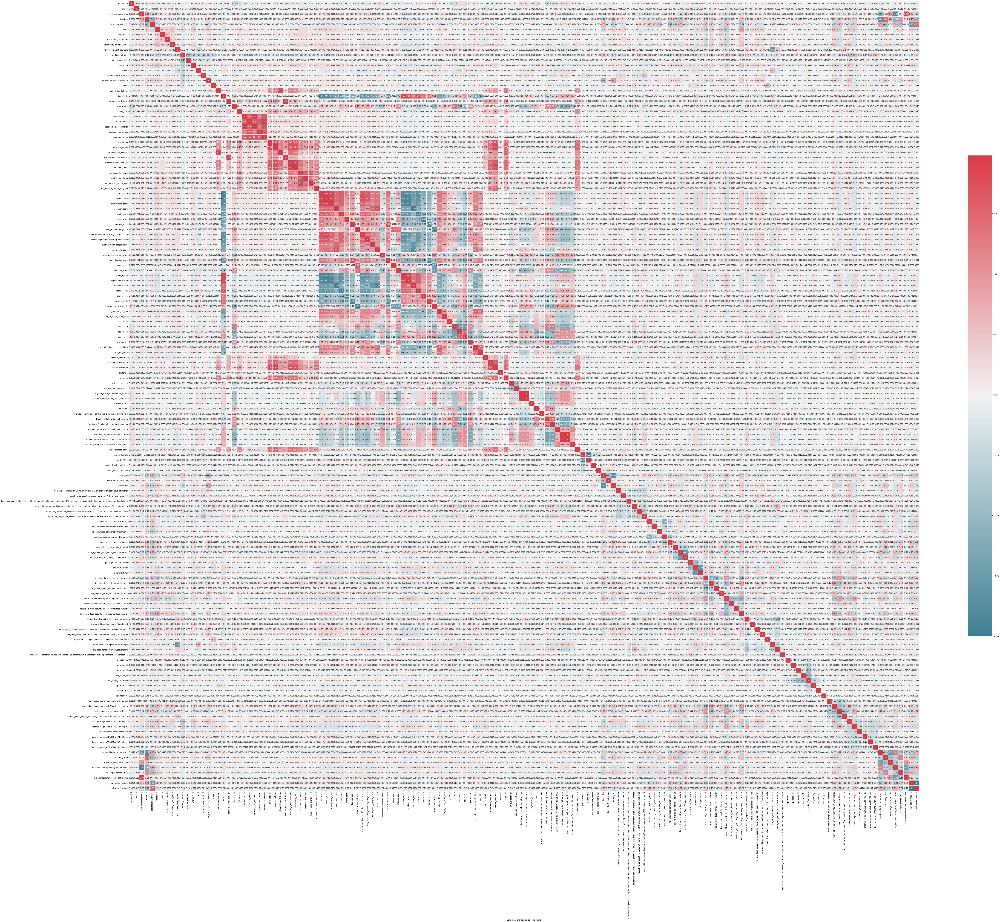

In [15]:
corr_c= data.corr()

#Set up the matplotlib figure
f, ax= plt.subplots(figsize=(100, 100))

#Generate diverging colormap
cmap= sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_c,annot=True, cmap=cmap, vmax=.99, square=True, linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)
plt.xlabel('OLIO users characteristics correlations')

In [38]:
from sklearn.preprocessing import LabelEncoder
def label_encode_df(df, columns):
    """Label encodes the specified columns in the dataframe.

    Args:
    df: The pandas dataframe.
    features: The list of columns to label encode.

    Returns:
    The label encoded dataframe.
    """

    for column in columns:
        encoder = LabelEncoder()
        df[column] = encoder.fit_transform(df[column])

    return df


#df = pd.DataFrame({'A': ['a', 'b', 'c'], 'B': [1, 2, 3]})
columns = ['gender', 'illness','household_composition','neighbourhood_comparison',
 'turn_to_friends_and_family',
 'foodbank',
 'neighbours',
 'close_family_or_friends',
 'community_or_faith_group',
 'none_of_the_above',
'pre_payment',
'fuel_security_label',
'household_food_security_label',
 'house_desc',
 'epc_rating', 
'worry_about_energy_payment',
 'worry_about_rent_payment',
 'working_full_time',
 'working_part_time',
 'unemployed',
 'retired',
 'not_working_house_or_child',
 'not_working_sick_or_disabled',
 'student',
 'income_range',
 'avoided_food_that_needs_cooked']

label_encoded_df = label_encode_df(data.copy(), columns.copy())

label_encoded_df= label_encoded_df.fillna(0)
#label_encoded_df = label_encoded_df.drop('agree_with_the_following_statement', axis=1)
#label_encoded_df.to_csv('label_encoded_dataset.csv')

In [18]:
data.columns.to_list()

['Unnamed: 0',
 'user_id',
 'lack_companionship',
 'isolation',
 'satisfaction_with_life',
 'foodbank',
 'neighbours',
 'close_family_or_friends',
 'community_or_faith_group',
 'worry_about_rent_payment',
 'working_full_time',
 'working_part_time',
 'unemployed',
 'retired',
 'not_working_house_or_child',
 'not_working_sick_or_disabled',
 'student',
 'added_food_listings',
 'imd_decile',
 'added_non_food_listings',
 'msoa_usage',
 'listing_rank',
 'added_comments',
 'added_stories',
 'received_likes_comments',
 'received_likes_stories',
 'received_comments',
 'given_ratings',
 'received_ratings',
 'donated_food_listings',
 'donated_non_food_listings',
 'number_of_conversations',
 'messages_count',
 'max_requests_month',
 'monthly_burstiness',
 'max_requests_month_food',
 'max_requests_month_non_food',
 'imd_score',
 'income_score',
 'employment_score',
 'education_score',
 'health_score',
 'crime_score',
 'barriers_score',
 'living_environment_score',
 'income_deprivation_affecting_chi

encoder = LabelEncoder()
encoder.fit(matrix_census['gender'])
original_encodings = encoder.inverse_transform(label_encoded_df['gender'])
original_encodings

Text(0.5, 1362.0937499999995, 'OLIO users characteristics correlations')

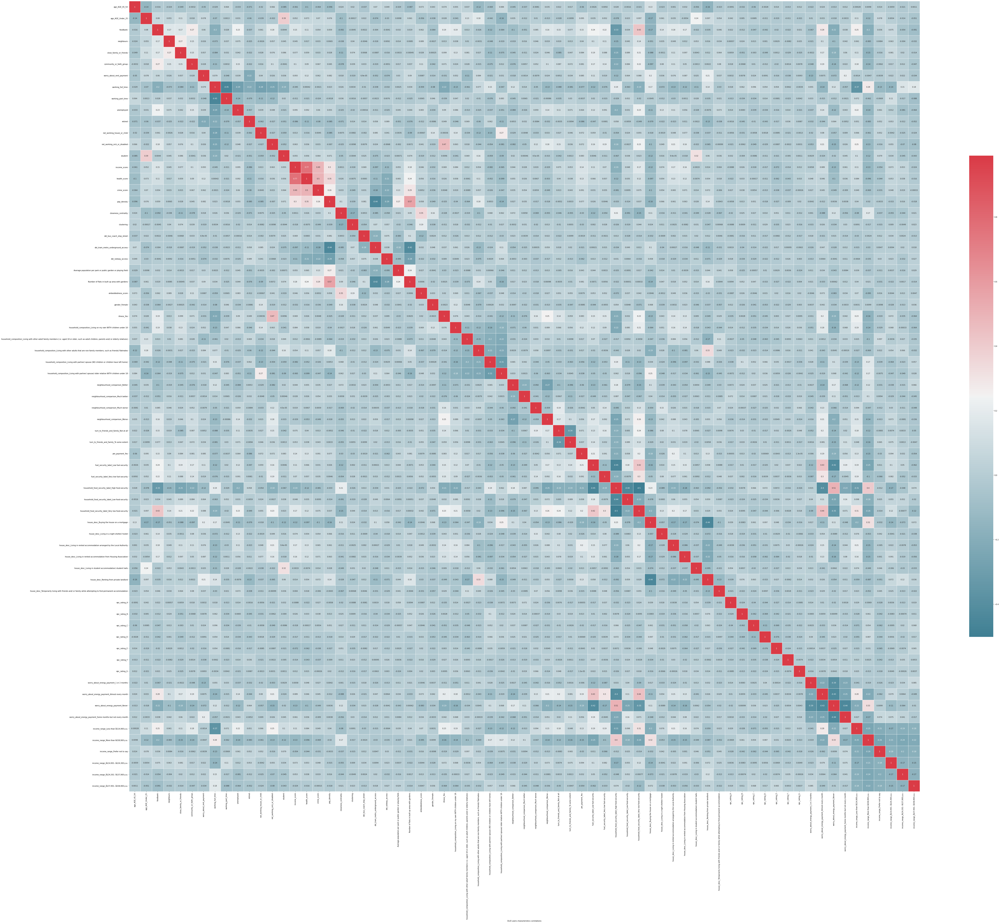

In [701]:
corr_c= x1.corr()

#Set up the matplotlib figure
f, ax= plt.subplots(figsize=(100, 100))

#Generate diverging colormap
cmap= sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_c,annot=True, cmap=cmap, vmax=.99, square=True, linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)
plt.xlabel('OLIO users characteristics correlations')

In [188]:
def identify_highly_correlated_variables(df, threshold=0.6):
  """
  Identifies any pairs of variables that have a high correlation (e.g., above 0.7 or 0.8).

  Args:
    df: A Pandas DataFrame.
    threshold: The correlation threshold.

  Returns:
    A list of tuples, where each tuple contains the names of two variables that have a correlation above the threshold.
  """

  # Calculate the correlation matrix.
  corr_matrix = df.corr()

  # Identify any pairs of variables that have a high correlation.
  highly_correlated_variables = []
  for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
      correlation = corr_matrix.iloc[i, j]
      if abs(correlation) > threshold:
        highly_correlated_variables.append((corr_matrix.columns[i], corr_matrix.columns[j]))

  return highly_correlated_variables
  
def identify_highly_negatively_correlated_variables(df, threshold=-0.45):
  """
  Identifies any pairs of variables that have a high negative correlation (e.g., -0.7 or -0.8).

  Args:
    df: A Pandas DataFrame.
    threshold: The correlation threshold.

  Returns:
    A list of tuples, where each tuple contains the names of two variables that have a correlation below the threshold.
  """

  # Calculate the correlation matrix.
  corr_matrix = df.corr()

  # Identify any pairs of variables that have a high negative correlation.
  highly_negatively_correlated_variables = []
  for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
      correlation = corr_matrix.iloc[i, j]
      if correlation < threshold:
        highly_negatively_correlated_variables.append((corr_matrix.columns[i], corr_matrix.columns[j]))

  return highly_negatively_correlated_variables

In [527]:
identify_highly_correlated_variables(x1)

[]

In [729]:
# tkae out negative cor vars
x1 = data.loc[:, [#'swl_below_median',
#'satisfaction_with_life_tertile',
#'age_AGE_25_to_34',
'age_AGE_45_54',
 #'age_AGE_35_44',
 #'age_AGE_55_64',
 #'age_AGE_Over_65',
 'age_AGE_Under_25',
                  #'lack_companionship',
                  #'isolation',
                  #'satisfaction_with_life',
                  'foodbank',
                  'neighbours',
                  'close_family_or_friends',
                  'community_or_faith_group',
                  'worry_about_rent_payment',
                  'working_full_time',
                  'working_part_time',
                  'unemployed',
                  'retired',
                  'not_working_house_or_child',
                  'not_working_sick_or_disabled',
                  'student',
                  #'added_food_listings',
                  #'imd_decile',
                  #'added_non_food_listings',
                  #'msoa_usage',
                  #'listing_rank',
                  #'added_comments',
                  #'added_stories',
                  #'received_likes_comments',
                  #'received_likes_stories',
                  #'received_comments',
                  #'given_ratings',
                  #'received_ratings',
                 # 'donated_food_listings',
                  #'donated_non_food_listings',
                  #'messages_count',
                  #'number_of_conversations',
                  #'max_requests_month',
                  #'monthly_burstiness',
                  #'max_requests_month_food',
                  #'max_requests_month_non_food',
                  #'imd_score',
                  #'employment_score',
                  'income_score',
                  #'education_score',
                  'health_score',
                  'crime_score',
                  #'barriers_score',
                  #'living_environment_score',
                  #'income_deprivation_affecting_older_score',
                  #'income_deprivation_affecting_children_score',
                  #'children_young_people_score',
                  #'adult_skills_score',
                  #'geographical_barriers_score',
                  #'wider_barriers_score',
                  #'indoors_score',
                  #'outdoors_score',
                  #'income_decile',
                  #'employment_decile',
                  #'education_decile',
                  #'health_decile',
                  #'crime_decile',
                  #'barriers_decile',
                  #'living_environment_decile',
                  #'uc_claimants_22_pop',
                 #'pc_of_pupils_taking_fsm',
                  #'pct_16to24',
                  #'pct_25to49',
                  #'pct_50to64',
                  #'pct_over65',
                  'pop_density',
                  #'pct_other_lone_parent_children',
                  #'pct_non_white',
                  'closeness_centrality',
                  #'betweenness_centrality',
                  #'degree_centrality',
                  'clustering',
                  #'pagerank',
                  #'dst_bus_coach_ts',
                  'dst_bus_coach_stop_street',
                  'dst_tram_metro_underground_access',
                  #'dst_tram_metro_underground_platform',
                  'dst_railway_access',
                  #'Population ',
                  'Average population per park or public garden or playing field',
                  #'Number of flats within built up area',
                  'Number of flats in built up area with gardens',
                  #'Average garden size for flats in built up area',
                  #'Number of houses within built up area',
                  #'Number of houses in built up area with gardens',
                  #'Average garden size for houses in built up area ',
                  'embeddedness_score',
                  'gender_Female',
                  #'gender_Male',
                  #'gender_Prefer not to say',
                  #'gender_Non binary/ other',
                  #'illness_No',
                  #'illness_Prefer not to say',
                  'illness_Yes',
                  #'household_composition_Living on my own (NO children or children have left home)',
                  'household_composition_Living on my own WITH children under 18',
                  'household_composition_Living with other adult family members (i.e. aged 18 or older, such as adult children, parents and/ or elderly relatives)',
                  'household_composition_Living with other adults that are non-family members, such as friends/ flatmates',
                  'household_composition_Living with partner/ spouse (NO children or children have left home)',
                  'household_composition_Living with partner/ spouse/ older relative WITH children under 18',
                  'neighbourhood_comparison_Better',
                  'neighbourhood_comparison_Much better',
                  'neighbourhood_comparison_Much worse',
                  #'neighbourhood_comparison_The same',
                  'neighbourhood_comparison_Worse',
                  'turn_to_friends_and_family_Not at all',
                  #'turn_to_friends_and_family_To a large extent',
                  'turn_to_friends_and_family_To some extent',
                  #"pre_payment_Don't know",
                  #'pre_payment_No',
                  'pre_payment_Yes',
                  #'fuel_security_label_High fuel-security',
                  'fuel_security_label_Low fuel-security',
                  #'fuel_security_label_Marginal fuel-security',
                  'fuel_security_label_Very low fuel-security',
                  'household_food_security_label_High food-security',
                  'household_food_security_label_Low food-security',
                  #'household_food_security_label_Marginal food-security',
                  'household_food_security_label_Very low food-security',
                  'house_desc_Buying the house on a mortgage',
                  'house_desc_Living in a night shelter/ hostel',
                  'house_desc_Living in rented accommodation arranged by the Local Authority',
                  'house_desc_Living in rented accommodation from Housing Association',
                  'house_desc_Living in student accommodation/ student halls',
                  #'house_desc_Owning the house outright',
                  'house_desc_Renting from private landlord',
                  'house_desc_Temporarily living with friends and/ or family while attempting to find permanent accommodation',
                  'epc_rating_A',
                  'epc_rating_B',
                  'epc_rating_C',
                  'epc_rating_D',
                  #"epc_rating_Don't know",
                  'epc_rating_E',
                  'epc_rating_F',
                  'epc_rating_G',
                  'worry_about_energy_payment_1 or 2 months',
                  'worry_about_energy_payment_Almost every month',
                  'worry_about_energy_payment_Never',
                  'worry_about_energy_payment_Some months but not every month',
                  'income_range_Less than Â£14,900 p.a.',
                  'income_range_More than Â£58,900 p.a.',
                  'income_range_Prefer not to say',
                  'income_range_Â£14,901- Â£24,300 p.a.',
                  'income_range_Â£24,301- Â£37,900 p.a.',
                  'income_range_Â£37,901- Â£58,900 p.a.',
                  #'isolation_Hardly ever or never',
                  #'isolation_Often',
                  #'isolation_Some of the time',
                  #'lack_companionship_Hardly ever or never',
                  #'lack_companionship_Often',
                  #'lack_companionship_Some of the time',
                  #'satisfaction_with_life_group'
                  ]]

# x1= x1[(np.abs(stats.zscore(x1)) <= 4).all(axis= 1)]

y1 = data.loc[data['satisfaction_with_life_tertile'].notnull(), ['satisfaction_with_life_tertile']]

print(len(x1))


2822


In [703]:
identify_highly_correlated_variables(x1)

[('income_score', 'health_score')]

In [704]:
x1.head(3)

,age_AGE_45_54,age_AGE_Under_25,foodbank,neighbours,close_family_or_friends,community_or_faith_group,worry_about_rent_payment,working_full_time,working_part_time,unemployed,...,worry_about_energy_payment_1 or 2 months,worry_about_energy_payment_Almost every month,worry_about_energy_payment_Never,worry_about_energy_payment_Some months but not every month,"income_range_Less than Â£14,900 p.a.","income_range_More than Â£58,900 p.a.",income_range_Prefer not to say,"income_range_Â£14,901- Â£24,300 p.a.","income_range_Â£24,301- Â£37,900 p.a.","income_range_Â£37,901- Â£58,900 p.a."
0,0,0,0,0,1,0,3,1,0,0,...,1,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,1,2,0,0,1,...,1,0,0,0,1,0,0,0,0,0
2,0,0,0,0,0,1,4,0,0,0,...,0,1,0,0,1,0,0,0,0,0


In [705]:
y1['satisfaction_with_life_tertile'].value_counts()

1    1542
0    1280
Name: satisfaction_with_life_tertile, dtype: int64

# Modelling

In [706]:
print(len(x1), len(y1))

2822 2822


In [707]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import *
from sklearn.feature_selection import *
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import *
from sklearn.ensemble import AdaBoostClassifier
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
sc= StandardScaler()

In [708]:
# Split the data into training, validation, and test sets
x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=1/4, random_state=425, stratify=y1)

In [709]:
x_val, x_test, y_val, y_test = train_test_split(x_test, y_test, test_size=0.5, random_state=425)

In [710]:
x_train.shape

(2116, 69)

In [711]:
x_test.shape

(353, 69)

In [712]:
x_val.shape

(353, 69)

In [713]:
# Why we use standard scaler -> https://thecleverprogrammer.com/2020/09/22/standardscaler-in-machine-learning/#:~:text=In%20Machine%20Learning%2C%20StandardScaler%20is,the%20standard%20deviation%20is%201.
# Why we use standard scaler -> https://thecleverprogrammer.com/2020/09/22/standardscaler-in-machine-learning/#:~:text=In%20Machine%20Learning%2C%20StandardScaler%20is,the%20standard%20deviation%20is%201.
sc= StandardScaler()
x_train_sc= pd.DataFrame(data= sc.fit_transform(x_train), index= x_train.index, columns= x_train.columns)
x_test_sc= pd.DataFrame(data= sc.fit_transform(x_test), index= x_test.index, columns= x_test.columns)
x_var_sc= pd.DataFrame(data= sc.fit_transform(x_val), index= x_val.index, columns= x_val.columns)
import imblearn.under_sampling
from imblearn.under_sampling import RandomUnderSampler

under= RandomUnderSampler(sampling_strategy= 1) #majority class = minority class
X_rus, y_rus= under.fit_resample(x_train_sc, y_train) # undersampling on the train


In [714]:
print('Train resampled values', y_rus.value_counts(), 'Test values', y_test.value_counts())

Train resampled values satisfaction_with_life_tertile
1                                 960
0                                 960
dtype: int64 Test values satisfaction_with_life_tertile
1                                 198
0                                 155
dtype: int64


In [715]:
x_train_sc.shape

(2116, 69)

In [716]:
x_test_sc.shape

(353, 69)

In [717]:
x_var_sc.shape

(353, 69)

# SWL model with accuracy 

In [718]:
rfc= RandomForestClassifier(random_state=42)
kbest= SelectKBest(f_classif)
pipe= Pipeline(steps= [('kbest', kbest), ('forest', rfc)])

param_dict= {"kbest__k":[5, 10, 15, 20, 25, 30, 35, 40, 45, 'all'],
              "forest__n_estimators":[1000],
              "forest__max_depth": [3,4,5],
              "forest__criterion" :['gini'],
              'forest__max_features': ['auto'],
              "forest__min_samples_split":[2,3,4,5]
            }
estimator2= GridSearchCV(pipe, param_dict, cv= 5)

estimator2.fit(X_rus, y_rus.values.ravel())

print("The best parameters: {0}".format(estimator2.best_params_))
# Evaluate the model on the validation set
val_predictions2 = estimator2.predict(x_var_sc)
test_predictions2= estimator2.predict(x_test_sc)
train_predictions2= estimator2.predict(X_rus)
#precision= accuracy_score(y_test, test_predictions2)* 100
#print("Accuracy with RandomForest: {0:.2f}%".format(precision))
print('---------------test prediction \n')
print(classification_report(y_test, test_predictions2))
print('---------------val prediction \n')
print(classification_report(y_val, val_predictions2))
print('---------------train prediction \n')
print(classification_report(y_rus, train_predictions2))

The best parameters: {'forest__criterion': 'gini', 'forest__max_depth': 5, 'forest__max_features': 'auto', 'forest__min_samples_split': 3, 'forest__n_estimators': 1000, 'kbest__k': 20}
---------------test prediction 

              precision    recall  f1-score   support

           0       0.62      0.70      0.66       155
           1       0.74      0.67      0.70       198

    accuracy                           0.68       353
   macro avg       0.68      0.68      0.68       353
weighted avg       0.69      0.68      0.68       353

---------------val prediction 

              precision    recall  f1-score   support

           0       0.67      0.68      0.67       165
           1       0.71      0.70      0.71       188

    accuracy                           0.69       353
   macro avg       0.69      0.69      0.69       353
weighted avg       0.69      0.69      0.69       353

---------------train prediction 

              precision    recall  f1-score   support

       

In [719]:
estimator2.best_params_

{'forest__criterion': 'gini',
 'forest__max_depth': 5,
 'forest__max_features': 'auto',
 'forest__min_samples_split': 3,
 'forest__n_estimators': 1000,
 'kbest__k': 20}

array([[736, 224],
       [331, 629]])

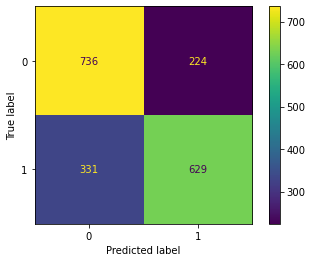

In [720]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

confusion_matrix= metrics.confusion_matrix(y_rus, train_predictions2)
metrics.ConfusionMatrixDisplay(confusion_matrix= confusion_matrix).plot()
plt.grid(False)
confusion_matrix

array([[112,  53],
       [ 56, 132]])

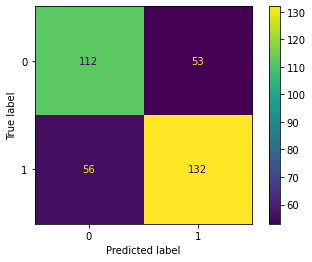

In [721]:
confusion_matrix= metrics.confusion_matrix(y_val, val_predictions2)
metrics.ConfusionMatrixDisplay(confusion_matrix= confusion_matrix).plot()
plt.grid(False)
confusion_matrix

## Shap for model with accuacy

CPU times: user 4 µs, sys: 9 µs, total: 13 µs
Wall time: 35 µs


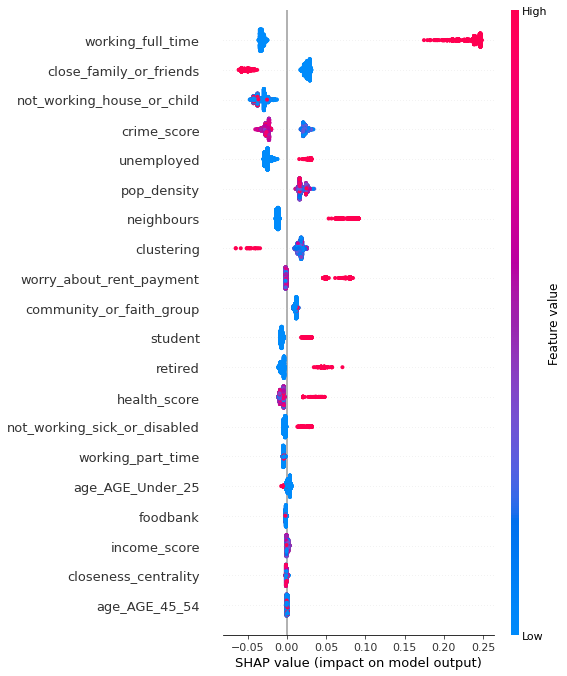

In [730]:
# Feature importance of the model 
import shap
shap.initjs()

# Based on the SHAP summary plot, we can see the top 15 features and their indications of the relationship between the value of a feature and the impact on the classification model.
# The y-axis is the SHAP value for that feature, which represents how much knowing that feature's value changes the output of the model for that sample's prediction.
# Color shows whether that feature was high or low for that row of the dataset
# Horizontal location shows whether the effect of that value caused a higher or lower prediction.

%time
samples= x_train

explainer= shap.TreeExplainer(estimator2.best_estimator_[1])

shap_values= explainer.shap_values(samples, approximate= False, check_additivity= False)


shap.summary_plot(shap_values[1], samples)

-----

----
# SWL Model With Balanced Accuracy

In [723]:
rfc= RandomForestClassifier(random_state=42)
kbest= SelectKBest(f_classif)
pipe= Pipeline(steps= [('kbest', kbest), ('forest', rfc)])

param_dict= {"kbest__k":[5, 10, 15, 20, 25, 30, 35, 40, 45, 'all'],
              "forest__n_estimators":[1000],
              "forest__max_depth": [3,4,5],
              "forest__criterion" :['gini'],
              'forest__max_features': ['auto'],
              "forest__min_samples_split":[2,3,4,5]
            }
estimator3= GridSearchCV(pipe, param_dict, scoring="balanced_accuracy",  cv= 5)

estimator3.fit(X_rus, y_rus.values.ravel())

print("The best parameters: {0}".format(estimator3.best_params_))
# Evaluate the model on the validation set
val_predictions3 = estimator3.predict(x_var_sc)
test_predictions3= estimator3.predict(x_test_sc)
train_predictions3= estimator3.predict(X_rus)
#precision= accuracy_score(y_test, test_predictions2)* 100
#print("Accuracy with RandomForest: {0:.2f}%".format(precision))
print('---------------test prediction \n')
print(classification_report(y_test, test_predictions3))
print('---------------val prediction \n')
print(classification_report(y_val, val_predictions3))
print('---------------train prediction \n')
print(classification_report(y_rus, train_predictions3))

The best parameters: {'forest__criterion': 'gini', 'forest__max_depth': 5, 'forest__max_features': 'auto', 'forest__min_samples_split': 3, 'forest__n_estimators': 1000, 'kbest__k': 20}
---------------test prediction 

              precision    recall  f1-score   support

           0       0.62      0.70      0.66       155
           1       0.74      0.67      0.70       198

    accuracy                           0.68       353
   macro avg       0.68      0.68      0.68       353
weighted avg       0.69      0.68      0.68       353

---------------val prediction 

              precision    recall  f1-score   support

           0       0.67      0.68      0.67       165
           1       0.71      0.70      0.71       188

    accuracy                           0.69       353
   macro avg       0.69      0.69      0.69       353
weighted avg       0.69      0.69      0.69       353

---------------train prediction 

              precision    recall  f1-score   support

       

In [724]:
estimator3.best_params_

{'forest__criterion': 'gini',
 'forest__max_depth': 5,
 'forest__max_features': 'auto',
 'forest__min_samples_split': 3,
 'forest__n_estimators': 1000,
 'kbest__k': 20}

array([[736, 224],
       [331, 629]])

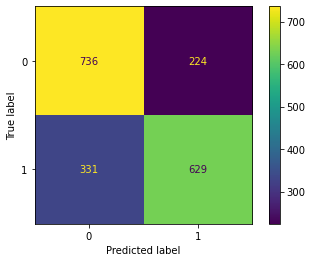

In [725]:
confusion_matrix= metrics.confusion_matrix(y_rus, train_predictions3)
metrics.ConfusionMatrixDisplay(confusion_matrix= confusion_matrix).plot()
plt.grid(False)
confusion_matrix

array([[112,  53],
       [ 56, 132]])

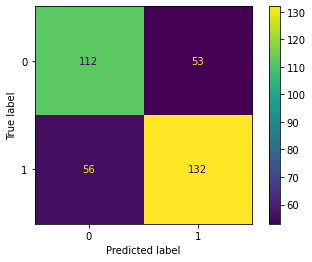

In [726]:
confusion_matrix= metrics.confusion_matrix(y_val, val_predictions3)
metrics.ConfusionMatrixDisplay(confusion_matrix= confusion_matrix).plot()
plt.grid(False)
confusion_matrix

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 10 µs


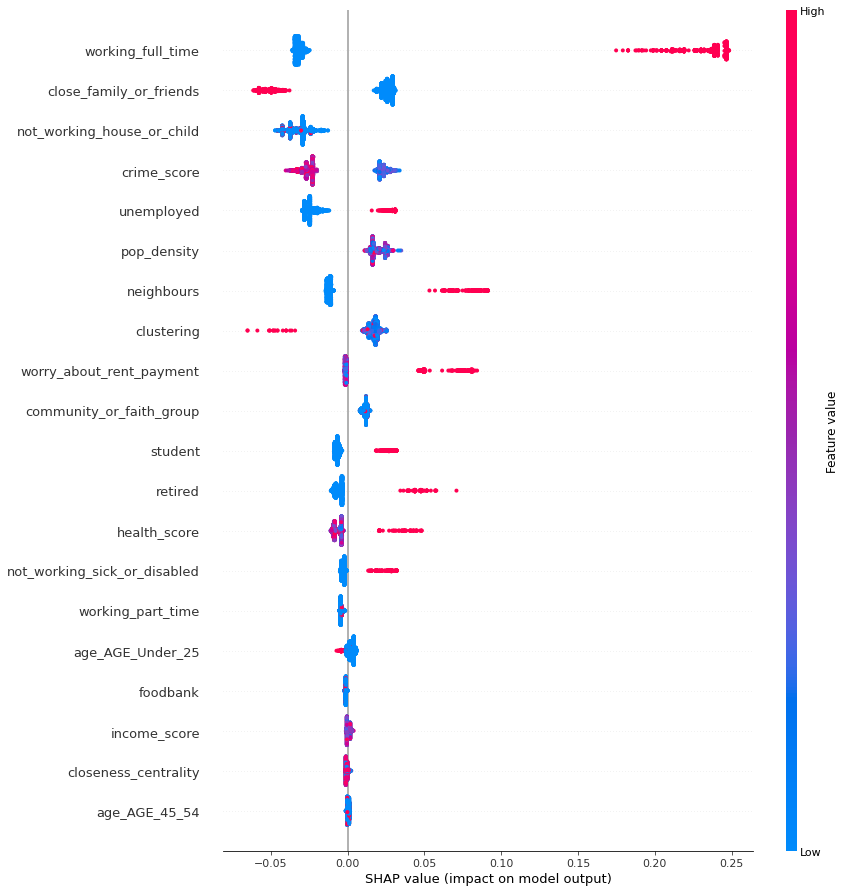

In [727]:
import shap
shap.initjs()

# Based on the SHAP summary plot, we can see the top 15 features and their indications of the relationship between the value of a feature and the impact on the classification model.
# The y-axis is the SHAP value for that feature, which represents how much knowing that feature's value changes the output of the model for that sample's prediction.
# Color shows whether that feature was high or low for that row of the dataset
# Horizontal location shows whether the effect of that value caused a higher or lower prediction.

%time
samples= x_train

explainer= shap.TreeExplainer(estimator3.best_estimator_[1])
shap_values= explainer.shap_values(samples, approximate= False, check_additivity= False)

shap.summary_plot(shap_values[1], samples, plot_size=(12.5, 12.5))

----
# Isolation features

In [265]:
# tkae out negative cor vars
x1 = data.loc[:, [#'swl_below_median',
'satisfaction_with_life_tertile',
                  #'lack_companionship',
                  #'isolation',
                  #'satisfaction_with_life',
                  'foodbank',
                  'neighbours',
                  'close_family_or_friends',
                  'community_or_faith_group',
                  'worry_about_rent_payment',
                  'working_full_time',
                  'working_part_time',
                  'unemployed',
                  'retired',
                  'not_working_house_or_child',
                  'not_working_sick_or_disabled',
                  'student',
                  #'added_food_listings',
                  #'imd_decile',
                  #'added_non_food_listings',
                  #'msoa_usage',
                  #'listing_rank',
                  'added_comments',
                  #'added_stories',
                  #'received_likes_comments',
                  #'received_likes_stories',
                  #'received_comments',
                  #'given_ratings',
                  #'received_ratings',
                  'donated_food_listings',
                  #'donated_non_food_listings',
                  #'messages_count',
                  #'number_of_conversations',
                  #'max_requests_month',
                  #'monthly_burstiness',
                  #'max_requests_month_food',
                  #'max_requests_month_non_food',
                  'imd_score',
                  #'employment_score',
                  #'income_score',
                  #'education_score',
                  #'health_score',
                  #'crime_score',
                  #'barriers_score',
                  #'living_environment_score',
                  #'income_deprivation_affecting_older_score',
                  #'income_deprivation_affecting_children_score',
                  #'children_young_people_score',
                  #'adult_skills_score',
                  #'geographical_barriers_score',
                  #'wider_barriers_score',
                  #'indoors_score',
                  #'outdoors_score',
                  #'income_decile',
                  #'employment_decile',
                  #'education_decile',
                  #'health_decile',
                  #'crime_decile',
                  #'barriers_decile',
                  #'living_environment_decile',
                  #'uc_claimants_22_pop',
                 #'pc_of_pupils_taking_fsm',
                  #'pct_16to24',
                  #'pct_25to49',
                  #'pct_50to64',
                  #'pct_over65',
                  'pop_density',
                  #'pct_other_lone_parent_children',
                  #'pct_non_white',
                  'closeness_centrality',
                  #'betweenness_centrality',
                  #'degree_centrality',
                  'clustering',
                  #'pagerank',
                  #'dst_bus_coach_ts',
                  'dst_bus_coach_stop_street',
                  'dst_tram_metro_underground_access',
                  #'dst_tram_metro_underground_platform',
                  'dst_railway_access',
                  #'Population ',
                  'Average population per park or public garden or playing field',
                  #'Number of flats within built up area',
                  'Number of flats in built up area with gardens',
                  #'Average garden size for flats in built up area',
                  #'Number of houses within built up area',
                  #'Number of houses in built up area with gardens',
                  #'Average garden size for houses in built up area ',
                  'embeddedness_score',
                  'gender_Female',
                  #'gender_Male',
                  #'gender_Prefer not to say',
                  #'gender_Non binary/ other',
                  #'illness_No',
                  #'illness_Prefer not to say',
                  'illness_Yes',
                  #'household_composition_Living on my own (NO children or children have left home)',
                  'household_composition_Living on my own WITH children under 18',
                  'household_composition_Living with other adult family members (i.e. aged 18 or older, such as adult children, parents and/ or elderly relatives)',
                  'household_composition_Living with other adults that are non-family members, such as friends/ flatmates',
                  'household_composition_Living with partner/ spouse (NO children or children have left home)',
                  'household_composition_Living with partner/ spouse/ older relative WITH children under 18',
                  'neighbourhood_comparison_Better',
                  'neighbourhood_comparison_Much better',
                  'neighbourhood_comparison_Much worse',
                  #'neighbourhood_comparison_The same',
                  'neighbourhood_comparison_Worse',
                  'turn_to_friends_and_family_Not at all',
                  #'turn_to_friends_and_family_To a large extent',
                  'turn_to_friends_and_family_To some extent',
                  #"pre_payment_Don't know",
                  #'pre_payment_No',
                  'pre_payment_Yes',
                  #'fuel_security_label_High fuel-security',
                  'fuel_security_label_Low fuel-security',
                  #'fuel_security_label_Marginal fuel-security',
                  'fuel_security_label_Very low fuel-security',
                  'household_food_security_label_High food-security',
                  'household_food_security_label_Low food-security',
                  #'household_food_security_label_Marginal food-security',
                  'household_food_security_label_Very low food-security',
                  'house_desc_Buying the house on a mortgage',
                  'house_desc_Living in a night shelter/ hostel',
                  'house_desc_Living in rented accommodation arranged by the Local Authority',
                  'house_desc_Living in rented accommodation from Housing Association',
                  'house_desc_Living in student accommodation/ student halls',
                  #'house_desc_Owning the house outright',
                  'house_desc_Renting from private landlord',
                  'house_desc_Temporarily living with friends and/ or family while attempting to find permanent accommodation',
                  'epc_rating_A',
                  'epc_rating_B',
                  'epc_rating_C',
                  'epc_rating_D',
                  #"epc_rating_Don't know",
                  'epc_rating_E',
                  'epc_rating_F',
                  'epc_rating_G',
                  'worry_about_energy_payment_1 or 2 months',
                  'worry_about_energy_payment_Almost every month',
                  'worry_about_energy_payment_Never',
                  'worry_about_energy_payment_Some months but not every month',
                  'income_range_Less than Â£14,900 p.a.',
                  'income_range_More than Â£58,900 p.a.',
                  'income_range_Prefer not to say',
                  'income_range_Â£14,901- Â£24,300 p.a.',
                  'income_range_Â£24,301- Â£37,900 p.a.',
                  'income_range_Â£37,901- Â£58,900 p.a.',
                  #'isolation_Hardly ever or never',
                  #'isolation_Often',
                  #'isolation_Some of the time',
                  #'lack_companionship_Hardly ever or never',
                  #'lack_companionship_Often',
                  #'lack_companionship_Some of the time',
                  #'satisfaction_with_life_group'
                  ]]

# x1= x1[(np.abs(stats.zscore(x1)) <= 4).all(axis= 1)]

y1 = data.loc[data['isolation'].notnull(), ['isolation']]

print(len(x1))


2822


In [266]:
x_train_sc= pd.DataFrame(data= sc.fit_transform(x_train), index= x_train.index, columns= x_train.columns)
x_test_sc= pd.DataFrame(data= sc.fit_transform(x_test), index= x_test.index, columns= x_test.columns)
x_var_sc= pd.DataFrame(data= sc.fit_transform(x_val), index= x_val.index, columns= x_val.columns)
import imblearn.under_sampling
from imblearn.under_sampling import RandomUnderSampler

under= RandomUnderSampler(sampling_strategy= 1) #majority class = minority class
X_rus, y_rus= under.fit_resample(x_train_sc, y_train) # undersampling on the train

In [267]:
rfc= RandomForestClassifier(random_state=42)
kbest= SelectKBest(f_classif)
pipe= Pipeline(steps= [('kbest', kbest), ('forest', rfc)])

param_dict= {"kbest__k":[5, 10, 15, 20, 25, 30, 35, 40, 45, 'all'],
              "forest__n_estimators":[1000],
              "forest__max_depth": [3,4,5],
              "forest__criterion" :['gini'],
              'forest__max_features': ['auto'],
              "forest__min_samples_split":[2,3,4,5]
            }
estimator4= GridSearchCV(pipe, param_dict, scoring="balanced_accuracy",  cv= 5)

estimator4.fit(X_rus, y_rus.values.ravel())

print("The best parameters: {0}".format(estimator4.best_params_))
# Evaluate the model on the validation set
val_predictions4 = estimator4.predict(x_var_sc)
test_predictions4= estimator4.predict(x_test_sc)
train_predictions4= estimator4.predict(X_rus)

The best parameters: {'forest__criterion': 'gini', 'forest__max_depth': 5, 'forest__max_features': 'auto', 'forest__min_samples_split': 3, 'forest__n_estimators': 1000, 'kbest__k': 10}


In [268]:
print('---------------test prediction \n')
print(classification_report(y_test, test_predictions4))
print('---------------val prediction \n')
print(classification_report(y_val, val_predictions4))
print('---------------train prediction \n')
print(classification_report(y_rus, train_predictions4))

---------------test prediction 

              precision    recall  f1-score   support

     Low_swl       0.78      0.75      0.76       197
 Medium_High       0.70      0.74      0.72       156

    accuracy                           0.74       353
   macro avg       0.74      0.74      0.74       353
weighted avg       0.74      0.74      0.74       353

---------------val prediction 

              precision    recall  f1-score   support

     Low_swl       0.77      0.62      0.69       189
 Medium_High       0.65      0.79      0.71       164

    accuracy                           0.70       353
   macro avg       0.71      0.71      0.70       353
weighted avg       0.71      0.70      0.70       353

---------------train prediction 

              precision    recall  f1-score   support

     Low_swl       0.76      0.69      0.72       960
 Medium_High       0.72      0.78      0.75       960

    accuracy                           0.73      1920
   macro avg       0.74      

array([[666, 294],
       [215, 745]])

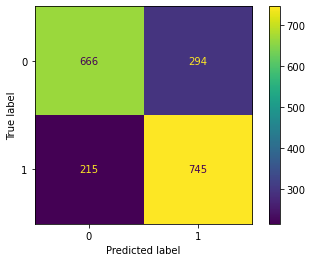

In [269]:
confusion_matrix= metrics.confusion_matrix(y_rus, train_predictions4)
metrics.ConfusionMatrixDisplay(confusion_matrix= confusion_matrix).plot()
plt.grid(False)
confusion_matrix

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 8.11 µs


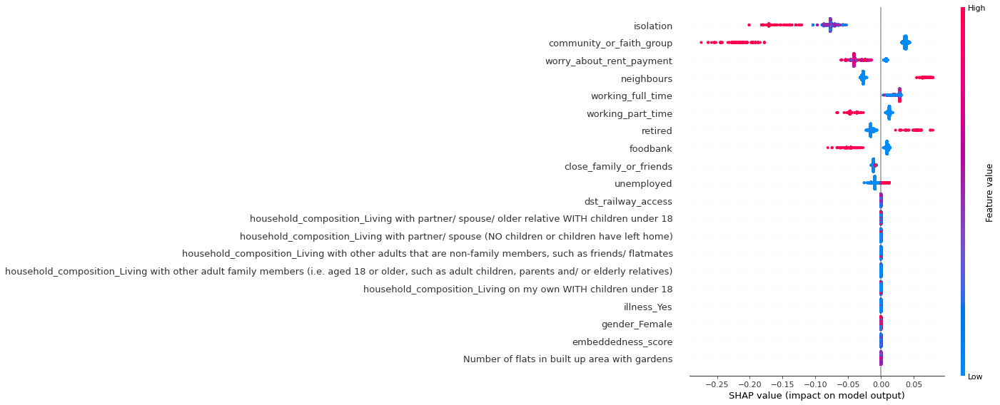

In [270]:
import shap
shap.initjs()

# Based on the SHAP summary plot, we can see the top 15 features and their indications of the relationship between the value of a feature and the impact on the classification model.
# The y-axis is the SHAP value for that feature, which represents how much knowing that feature's value changes the output of the model for that sample's prediction.
# Color shows whether that feature was high or low for that row of the dataset
# Horizontal location shows whether the effect of that value caused a higher or lower prediction.

%time
samples= x_train

explainer= shap.TreeExplainer(estimator4.best_estimator_[1])
shap_values= explainer.shap_values(samples, approximate= False, check_additivity= False)

shap.summary_plot(shap_values[1], samples)

# For Further Consideration
Creating a disparity score - the difference between the isolation and loneliness values

if  isolation == 0 and companionship >= 1 
or companionship == 0 and isolation >= 1
isolation_difference_metric == 1



subtract the number with the smallest value from the number with the largest value

In [ ]:
survey_transport_greenspace_df['loneliness_disparity_score'] = survey_transport_greenspace_df.apply(lonliness_difference(survey_transport_greenspace_df['isolation'], survey_transport_greenspace_df['lack_companionship']))
survey_transport_greenspace_df['loneliness_disparity_score']

In [27]:
survey_transport_greenspace_df['loneliness_difference_score'] = survey_transport_greenspace_df['lack_companionship'] - survey_transport_greenspace_df['isolation']
survey_transport_greenspace_df['loneliness_difference_score'].value_counts(ascending=False)

 0    2051
 1     417
-1     332
 2      11
-2      11
Name: loneliness_difference_score, dtype: int64

In [60]:
survey_transport_greenspace_df['loneliness_binary'].value_counts()

0.0    2232
1.0     590
Name: loneliness_binary, dtype: int64